In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

In [4]:
!pip install cmap
from cmap import Colormap

cm = Colormap('cmasher:fusion')  # case insensitive

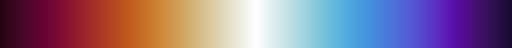

In [5]:
cm

In [6]:
charges_list = list(Path("charges").glob("*npz"))

In [7]:
charges_list[::100]

[PosixPath('charges/r1_1p000_r2_1p316_ang_148p421.mp2_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p000_ang_148p421.mp2_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p368_ang_180p000.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p000_ang_120p000.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p342_ang_120p000.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p342_ang_157p895.mp2_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p079_ang_123p158.hf_charges.npz'),
 PosixPath('charges/r1_1p021_r2_1p105_ang_142p105.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p263_ang_126p316.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p184_ang_123p158.hf_charges.npz'),
 PosixPath('charges/r1_1p000_r2_1p132_ang_154p737.hf_charges.npz')]

In [8]:
data = np.load(charges_list[0])
# data.keys()
for k in data.keys():
    print(k, data[k].shape)

atoms (3,)
coordinates_angstrom (3, 3)
charges_hirshfeld (3,)
charges_vdd (3,)
charges_becke (3,)
charges_adch (3,)
charges_chelpg (3,)
charges_mk (3,)
charges_cm5 (3,)
charges_mbis (3,)
mbis_charges_raw (3,)
mbis_dipoles (3, 3)
mbis_quadrupole_cartesian (3, 6)
mbis_quadrupole_traceless (3, 6)


In [9]:
charges = data["charges_hirshfeld"]
charges

array([ 0.41735995, -0.08778083, -0.32957912])

In [10]:
import ase

In [11]:
mol = ase.Atoms(data["atoms"], data["coordinates_angstrom"])

In [56]:
datas = [np.load(c) for c in charges_list]
mols=[ase.Atoms(data["atoms"], data["coordinates_angstrom"]) for data in datas]
charges = [data["charges_mbis"] for data in datas]
mols[0]

Atoms(symbols='CO2', pbc=False)

In [29]:
mols


[Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols='CO2', pbc=False),
 Atoms(symbols

In [15]:
from ase.visualize import plot as ase_plot
charges

array([ 0.41735995, -0.08778083, -0.32957912])

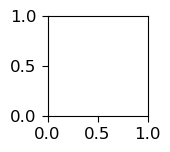

In [17]:
import patchworklib as pw
brick = pw.Brick()

In [22]:
brick.add_colorbar?

Signature:
brick.add_colorbar(
    cmap=None,
    x=None,
    y=None,
    vmin=0,
    vmax=1,
    hratio=None,
    wratio=None,
    coordinate='relative',
    label=None,
    **args,
)
Docstring:
Set a common colorbar for Brick(s) objects in the Bricks object and return 
a new Bricks object including the colorbar.

Parameters
----------
cmap : Colormap, default: 'viridis'
    The colormap to use.
x : float, default: None
    if args['orientation'] is 'vertical', the value will be adjusted as the colorbar 
    is placed on 'lower right' of the Bricks object. if args['orientation'] is 
    'horizontal', the value will be adjusted as the colorbar is placed on 'lower center' 
    of the Bricks object. The zero position for `x` is the most left axes of the Brick 
    objects in the Bricks object.
y : float, default: None
    if args['orientation'] is 'vertical', the value will be adjusted as the colorbar 
    is placed on 'lower right' of the Bricks object. if args['orientation'] is 
    'h

In [71]:
np.array(charges).mean(axis=0)

array([ 1.19512043, -0.51473647, -0.68038397])

(np.float64(1.7783953561777608),
 np.float64(1.0),
 np.float64(1.289000428219091))

In [118]:
import matplotlib as mpl
brick = pw.Brick()
norm = mpl.colors.Normalize(vmin=-.1, vmax=.1)
for mol, chargess in zip(mols[::16], charges[::16]):
    colored_charges = cm.to_matplotlib()(norm((chargess - np.array(charges).mean(axis=0))))
    rad = np.array([mol.get_angle(0,1,2), mol.get_distance(0,1), mol.get_distance(0,2)])/100
    rad[0] /= 50
    p = ase_plot.plot_atoms(mol, ax = brick, rotation=('90x,45y,0z'), radii=rad,
                     colors=colored_charges)


brick.set_xlim(-0.1, 1.051)
brick.set_ylim(0,2.83)
brick.change_plotsize((5, 8))
brick.set_ylabel("$Z$")
brick.set_xlabel("$X$")
brick
brick= brick.add_colorbar(cm.to_matplotlib(), 
                   hratio=1, vmin=-0.1, vmax=0.1)


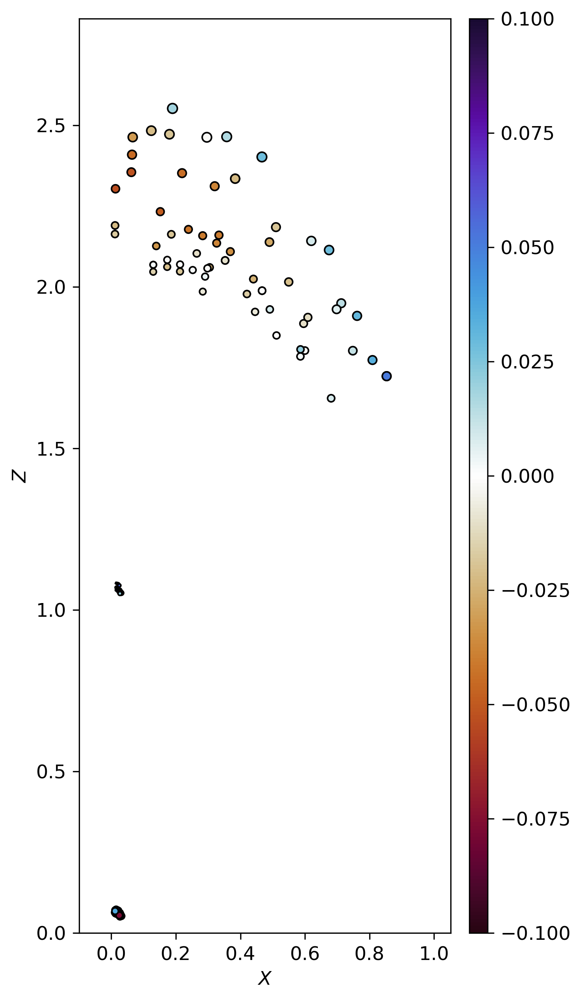

In [119]:
brick

In [98]:
cm.to_matplotlib()(charges)

array([[[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ]],

       [[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ]],

       [[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ]],

       ...,

       [[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ]],

       [[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.        ]],

       [[0.09537889, 0.03791701, 0.19486783, 1.        ],
        [0.15269566, 0.0159421 , 0.06988881, 1.  

In [121]:
im = plt.matshow([charges], vmin=-1, vmax=1, cmap=cm.to_matplotlib())
plt.clf()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7344776355..1.4689532037].


<Figure size 1600x200 with 0 Axes>

In [122]:
colored_charges

array([[0.70388623, 0.85904276, 0.88628135, 1.        ],
       [0.31299046, 0.66034252, 0.86799697, 1.        ],
       [0.73984165, 0.32511988, 0.12534501, 1.        ]])

In [123]:
charges

[array([ 1.1353177, -0.4356878, -0.6996299]),
 array([ 1.00617467, -0.35427849, -0.65189617]),
 array([ 1.30344972, -0.60775059, -0.69569913]),
 array([ 1.29466377, -0.615898  , -0.67876577]),
 array([ 1.18325529, -0.52721608, -0.65603921]),
 array([ 1.28216611, -0.56115874, -0.72100737]),
 array([ 0.84944827, -0.29059732, -0.55885095]),
 array([ 1.10059188, -0.41375456, -0.68683732]),
 array([ 1.22651585, -0.51189798, -0.71461787]),
 array([ 0.99420548, -0.34959413, -0.64461135]),
 array([ 1.27738762, -0.5480229 , -0.72936472]),
 array([ 1.32783028, -0.66108753, -0.66674275]),
 array([ 1.26362755, -0.53056982, -0.73305774]),
 array([ 1.32783028, -0.66108753, -0.66674275]),
 array([ 1.18882508, -0.48381485, -0.70501023]),
 array([ 1.08444628, -0.41089411, -0.67355217]),
 array([ 1.2922811 , -0.60197729, -0.69030382]),
 array([ 1.10059188, -0.41375456, -0.68683732]),
 array([ 1.05047397, -0.39421983, -0.65625414]),
 array([ 1.31339939, -0.58856433, -0.72483506]),
 array([ 0.93471969, -0

In [124]:
# Rebuild everything into ONE big figure and avoid requiring caas_jupyter_tools.
# If your arrays/objects are already defined in your session, this will use them;
# otherwise it creates small placeholders so the layout is visible end-to-end.
#
# The figure includes:
#  - Atoms colored by MBIS charges (ASE if available, else 3D scatter fallback, projected as 2D scatter for grid).
#  - matshow panels for each charge scheme
#  - matshow panels for MBIS dipoles and quadrupoles (Cartesian & traceless)
#
# It also writes the per-atom table to HTML and LaTeX files (links printed below).
def sumnmary_plot():
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
from pathlib import Path

mol = ase.Atoms(data["atoms"], data["coordinates_angstrom"])


# ---------- Helpers / fallbacks ----------
def get_cmap():
    if "cm" in globals():
        try:
            return globals()["cm"].to_matplotlib()
        except Exception:
            pass
    return plt.get_cmap("coolwarm")

def ensure_array(name, arr, shape):
    arr = np.asarray(arr)
    if arr.shape != shape:
        raise ValueError(f"{name} expected shape {shape}, got {arr.shape}")
    return arr

# placeholders_used = False
# if not all(k in globals() for k in [
#     "atoms", "coordinates_angstrom",
#     "charges_hirshfeld", "charges_vdd", "charges_becke", "charges_adch",
#     "charges_chelpg", "charges_mk", "charges_cm5", "charges_mbis",
#     "mbis_charges_raw", "mbis_dipoles", "mbis_quadrupole_cartesian", "mbis_quadrupole_traceless",
#     "mol", "ase_plot"
# ]):
#     placeholders_used = True
#     atoms = np.array(["O", "H", "H"], dtype=object)                    # (3,)
#     coordinates_angstrom = np.array([[0.0, 0.0, 0.0],                  # (3,3)
#                                      [0.9572, 0.0, 0.0],
#                                      [-0.2396, 0.927, 0.0]])
#     rng = np.random.default_rng(42)
#     charges_hirshfeld = rng.normal(0, 0.2, size=3)
#     charges_vdd       = rng.normal(0, 0.2, size=3)
#     charges_becke     = rng.normal(0, 0.2, size=3)
#     charges_adch      = rng.normal(0, 0.2, size=3)
#     charges_chelpg    = rng.normal(0, 0.2, size=3)
#     charges_mk        = rng.normal(0, 0.2, size=3)
#     charges_cm5       = rng.normal(0, 0.2, size=3)
#     charges_mbis      = rng.normal(0, 0.2, size=3)
#     mbis_charges_raw  = charges_mbis + rng.normal(0, 0.05, size=3)
#     mbis_dipoles      = rng.normal(0, 0.2, size=(3, 3))
#     mbis_quadrupole_cartesian = rng.normal(0, 0.2, size=(3, 6))
#     mbis_quadrupole_traceless = rng.normal(0, 0.2, size=(3, 6))
#     mol = None
#     ase_plot = None

# Validate
atoms = ensure_array("atoms", atoms, (3,))
coordinates_angstrom = ensure_array("coordinates_angstrom", coordinates_angstrom, (3, 3))
charges_hirshfeld = ensure_array("charges_hirshfeld", charges_hirshfeld, (3,))
charges_vdd       = ensure_array("charges_vdd", charges_vdd, (3,))
charges_becke     = ensure_array("charges_becke", charges_becke, (3,))
charges_adch      = ensure_array("charges_adch", charges_adch, (3,))
charges_chelpg    = ensure_array("charges_chelpg", charges_chelpg, (3,))
charges_mk        = ensure_array("charges_mk", charges_mk, (3,))
charges_cm5       = ensure_array("charges_cm5", charges_cm5, (3,))
charges_mbis      = ensure_array("charges_mbis", charges_mbis, (3,))
mbis_charges_raw  = ensure_array("mbis_charges_raw", mbis_charges_raw, (3,))
mbis_dipoles      = ensure_array("mbis_dipoles", mbis_dipoles, (3, 3))
mbis_q_cart       = ensure_array("mbis_quadrupole_cartesian", mbis_quadrupole_cartesian, (3, 6))
mbis_q_trcl       = ensure_array("mbis_quadrupole_traceless",  mbis_quadrupole_traceless,  (3, 6))

# ASE availability check
have_ase_plot = False
try:
    import ase  # noqa: F401
    have_ase_plot = (ase_plot is not None) and (mol is not None)
except Exception:
    have_ase_plot = False

VMIN,VMAX = -0.5,.5
norm = mpl.colors.Normalize(vmin=VMIN, vmax=VMAX)
cmap = get_cmap()

# Prepare lists for grid
charge_schemes = [
    ("Hirshfeld", charges_hirshfeld),
    ("VDD",       charges_vdd),
    ("Becke",     charges_becke),
    ("ADCH",      charges_adch),
    ("CHELPG",    charges_chelpg),
    ("MK",        charges_mk),
    ("CM5",       charges_cm5),
    ("MBIS",      charges_mbis),
    ("MBIS_raw",  mbis_charges_raw),
]

# Create big figure: 5 rows x 3 cols = 15 slots (we'll use 13)
fig = plt.figure(figsize=(16, 20))
gs = GridSpec(5, 3, figure=fig, wspace=0.35, hspace=0.35)

# 1) Atoms colored by MBIS charges
ax0 = fig.add_subplot(gs[0, 0])
if have_ase_plot:
    try:
        # draw into this axes by temporarily switching current axes
        plt.sca(ax0)
        ase_plot.plot_atoms(mol, rotation=('90x,45y,0z'), radii=[0.1, 0.1, 0.1],
                            colors=cmap(norm(charges_mbis)))
        ax0.set_title("Atoms colored by MBIS charge")
        # Create a small inset colorbar for atom colors
        mappable0 = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
        cbar0 = fig.colorbar(mappable0, ax=ax0, fraction=0.046, pad=0.04)
        cbar0.ax.set_ylabel("Charge")
    except Exception:
        have_ase_plot = False

if not have_ase_plot:
    # 2D scatter projection for grid (simple xy projection for compactness)
    sc = ax0.scatter(coordinates_angstrom[:, 0], coordinates_angstrom[:, 1],
                     s=400, c=charges_mbis, cmap=cmap, norm=norm)
    for i, sym in enumerate(atoms):
        ax0.text(coordinates_angstrom[i, 0], coordinates_angstrom[i, 1], f"{sym}{i}", ha="center", va="center", fontsize=10)
    ax0.set_xlabel("x (Å)")
    ax0.set_ylabel("y (Å)")
    ax0.set_title("Atoms colored by MBIS charge (xy projection)")
    cbar0 = fig.colorbar(sc, ax=ax0, fraction=0.046, pad=0.04)
    cbar0.ax.set_ylabel("Charge")

# 2) Charge scheme matshows fill the remaining cells row-wise starting at [0,1]
slot_indices = [(r, c) for r in range(5) for c in range(3)]
# Reserve (0,0) for atoms panel; next slots start from (0,1)
slot_ptr = 1  # index into slot_indices
for name, arr in charge_schemes:
    r, c = slot_indices[slot_ptr]
    ax = fig.add_subplot(gs[r, c])
    im = ax.matshow(arr.reshape(1, -1), vmin=VMIN, vmax=VMAX,  cmap=cmap)
    ax.set_title(f"{name} charges")
    ax.set_yticks([])
    ax.set_xticks(range(arr.size), [f"{atoms[i]}{i}" for i in range(arr.size)])
    slot_ptr += 1

# 3) MBIS dipoles
r, c = slot_indices[slot_ptr]; slot_ptr += 1
ax = fig.add_subplot(gs[r, c])
im = ax.matshow(mbis_dipoles, vmin=VMIN, vmax=VMAX, cmap=cmap)
ax.set_title("MBIS dipoles (μx, μy, μz)")
ax.set_yticks(range(3), [f"{atoms[i]}{i}" for i in range(3)])
ax.set_xticks(range(3), ["μx", "μy", "μz"])

# 4) MBIS quadrupoles (Cartesian)
r, c = slot_indices[slot_ptr]; slot_ptr += 1
ax = fig.add_subplot(gs[r, c])
im = ax.matshow(mbis_q_cart, vmin=VMIN, vmax=VMAX, cmap=cmap)
ax.set_title("MBIS quadrupole (Cartesian)")
ax.set_yticks(range(3), [f"{atoms[i]}{i}" for i in range(3)])
ax.set_xticks(range(6), ["Qxx", "Qyy", "Qzz", "Qxy", "Qxz", "Qyz"], rotation=0)

# 5) MBIS quadrupoles (Traceless)
r, c = slot_indices[slot_ptr]; slot_ptr += 1
ax = fig.add_subplot(gs[r, c])
im = ax.matshow(mbis_q_trcl, vmin=VMIN, vmax=VMAX, cmap=cmap)
ax.set_title("MBIS quadrupole (Traceless)")
ax.set_yticks(range(3), [f"{atoms[i]}{i}" for i in range(3)])
ax.set_xticks(range(6), ["Qxx", "Qyy", "Qzz", "Qxy", "Qxz", "Qyz"], rotation=0)

# Add one shared colorbar for all matshow plots
# We'll tie it to the last 'im' used (they all share same norm/cmap)
cbar = fig.colorbar(im, ax=[fig.axes[i] for i in range(1, len(fig.axes))], shrink=0.6, fraction=0.03, pad=0.02)
# cbar.ax.set_ylabel("Value (normalized to [-1,1])")

fig.suptitle("Atomic Charges & MBIS Multipole Moments", fontsize=16)
plt.tight_layout(rect=[0, 0.02, 1, 0.98])

# Save figure
out_dir = Path(".")
out_dir.mkdir(parents=True, exist_ok=True)
fig_path_png = out_dir / "all_charges_and_multipoles.png"
fig_path_pdf = out_dir / "all_charges_and_multipoles.pdf"
fig.savefig(fig_path_png, dpi=200)
fig.savefig(fig_path_pdf)

# ---------- Table to HTML + LaTeX ----------
df = pd.DataFrame({
    "atom": atoms,
    "x(Å)": coordinates_angstrom[:, 0],
    "y(Å)": coordinates_angstrom[:, 1],
    "z(Å)": coordinates_angstrom[:, 2],
    "q_Hirshfeld": charges_hirshfeld,
    "q_VDD": charges_vdd,
    "q_Becke": charges_becke,
    "q_ADCH": charges_adch,
    "q_CHELPG": charges_chelpg,
    "q_MK": charges_mk,
    "q_CM5": charges_cm5,
    "q_MBiS": charges_mbis,
    "q_MBiS_raw": mbis_charges_raw,
})

html_path = out_dir / "atomic_properties_and_charges.html"
tex_path  = out_dir / "atomic_properties_and_charges.tex"
html_path.write_text(df.to_html(index=False))
tex_path.write_text(df.to_latex(index=False, float_format="%.6g"))

print("Big figure saved:")
print(" - PNG:", fig_path_png)
print(" - PDF:", fig_path_pdf)
print("Table saved:")
print(" - HTML:", html_path)
print(" - LaTeX:", tex_path)
print("Placeholders used for demo data:", placeholders_used)


IndentationError: expected an indented block after function definition on line 11 (1051730582.py, line 12)

In [125]:
# Modular utilities + functions:
# - summary_plot(data): builds the single, consolidated figure (same layout as before)
# - discover_scans(...): finds and sorts your *.npz charge files and parses r1, r2, ang, level (hf/mp2)
# - load_scan(...): loads one .npz and returns a standardized dict 'data' for summary_plot
# - animate_scan(...): creates an animation over the scan using Pillow (GIF) writer (no external deps)
# - plot_xy_series(...): makes simple XY plots of per-atom charges vs. scan index or angle
#
# All charts use matplotlib, one figure per chart (no seaborn, no styles), and MBIS multipoles via matshow.
# If no real files are found, small placeholders are used so the workflow runs end-to-end.

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
from matplotlib.animation import FuncAnimation, PillowWriter
from pathlib import Path

# -----------------------------
# Parsing helpers & discovery
# -----------------------------

_scan_re = re.compile(
    r"r1_(?P<r1>[\d]+p[\d]+)_r2_(?P<r2>[\d]+p[\d]+)_ang_(?P<ang>[\d]+p[\d]+)\.(?P<level>mp2|hf)_charges\.npz$"
)

def _p_to_float(s: str) -> float:
    # Turn 148p421 -> 148.421
    return float(s.replace("p", "."))

def parse_scan_filename(path: Path):
    m = _scan_re.search(path.name)
    if not m:
        return None
    r1 = _p_to_float(m.group("r1"))
    r2 = _p_to_float(m.group("r2"))
    ang = _p_to_float(m.group("ang"))
    level = m.group("level")
    return {"r1": r1, "r2": r2, "ang": ang, "level": level}

def discover_scans(directory="charges"):
    directory = Path(directory)
    files = sorted(directory.glob("*.npz"))
    entries = []
    for f in files:
        meta = parse_scan_filename(f)
        if meta is None:
            continue
        meta["path"] = f
        entries.append(meta)
    # Sort "cleverly": primarily by angle, then r2, then r1; separate by level to allow grouped animations
    entries.sort(key=lambda d: (d["ang"], d["r2"], d["r1"], d["level"]))
    return entries

# -----------------------------
# Data loading
# -----------------------------

_expected_keys = [
    "atoms", "coordinates_angstrom",
    "charges_hirshfeld", "charges_vdd", "charges_becke", "charges_adch",
    "charges_chelpg", "charges_mk", "charges_cm5", "charges_mbis",
    "mbis_charges_raw", "mbis_dipoles", "mbis_quadrupole_cartesian", "mbis_quadrupole_traceless"
]

def _ensure_shape(name, arr, shape):
    arr = np.asarray(arr)
    if arr.shape != shape:
        raise ValueError(f"{name} expected shape {shape}, got {arr.shape}")
    return arr

def load_scan(npz_path: Path):
    npz = np.load(npz_path, allow_pickle=True)
    # Extract required arrays; allow atoms to be strings (object) or bytes-like that decode
    data = {}
    for k in _expected_keys:
        if k not in npz:
            raise KeyError(f"Missing key '{k}' in {npz_path}")
        data[k] = npz[k]

    # Normalize atoms to string array
    atoms = data["atoms"]
    if atoms.dtype.kind in ("S", "U", "O"):
        atoms = atoms.astype(object)
    else:
        atoms = atoms.astype(object)
    data["atoms"] = atoms

    # Validate shapes based on # of atoms
    n = len(atoms)
    data["coordinates_angstrom"] = _ensure_shape("coordinates_angstrom", data["coordinates_angstrom"], (n, 3))
    for k in [
        "charges_hirshfeld","charges_vdd","charges_becke","charges_adch","charges_chelpg",
        "charges_mk","charges_cm5","charges_mbis","mbis_charges_raw"
    ]:
        data[k] = _ensure_shape(k, data[k], (n,))
    data["mbis_dipoles"] = _ensure_shape("mbis_dipoles", data["mbis_dipoles"], (n, 3))
    data["mbis_quadrupole_cartesian"] = _ensure_shape("mbis_quadrupole_cartesian", data["mbis_quadrupole_cartesian"], (n, 6))
    data["mbis_quadrupole_traceless"] = _ensure_shape("mbis_quadrupole_traceless", data["mbis_quadrupole_traceless"], (n, 6))

    # also tack on meta from filename
    meta = parse_scan_filename(Path(npz_path))
    if meta:
        data.update({f"meta_{k}": v for k, v in meta.items() if k != "path"})
    return data

# -----------------------------
# Plotting core
# -----------------------------

def summary_plot(data, fig=None):
    """
    Build the consolidated figure for a single data dict.
    Returns the matplotlib figure.
    """
    atoms = data["atoms"]
    coords = data["coordinates_angstrom"]
    charges = {
        "Hirshfeld": data["charges_hirshfeld"],
        "VDD": data["charges_vdd"],
        "Becke": data["charges_becke"],
        "ADCH": data["charges_adch"],
        "CHELPG": data["charges_chelpg"],
        "MK": data["charges_mk"],
        "CM5": data["charges_cm5"],
        "MBIS": data["charges_mbis"],
        "MBIS_raw": data["mbis_charges_raw"],
    }
    dip = data["mbis_dipoles"]
    q_cart = data["mbis_quadrupole_cartesian"]
    q_trcl = data["mbis_quadrupole_traceless"]

    norm = mpl.colors.Normalize(vmin=-1, vmax=1)
    # If a custom 'cm' with to_matplotlib() exists in scope, use it; else default coolwarm
    cmap = None
    if "cm" in globals():
        try:
            cmap = globals()["cm"].to_matplotlib()
        except Exception:
            pass
    if cmap is None:
        cmap = plt.get_cmap("coolwarm")

    # Create big figure: 5 rows x 3 cols
    if fig is None:
        fig = plt.figure(figsize=(16, 20))
    gs = GridSpec(5, 3, figure=fig, wspace=0.35, hspace=0.35)

    # 1) Atoms colored by MBIS charges (xy projection for compactness)
    ax0 = fig.add_subplot(gs[0, 0])
    sc = ax0.scatter(coords[:, 0], coords[:, 1], s=400, c=charges["MBIS"], cmap=cmap, norm=norm)
    for i, sym in enumerate(atoms):
        ax0.text(coords[i, 0], coords[i, 1], f"{sym}{i}", ha="center", va="center", fontsize=10)
    ax0.set_xlabel("x (Å)")
    ax0.set_ylabel("y (Å)")
    ax0.set_title("Atoms colored by MBIS charge (xy projection)")
    cbar0 = fig.colorbar(sc, ax=ax0, fraction=0.046, pad=0.04)
    cbar0.ax.set_ylabel("Charge")

    # 2) Charge scheme matshows
    slot_indices = [(r, c) for r in range(5) for c in range(3)]
    slot_ptr = 1  # (0,0) reserved by atom panel
    last_im = None
    for name, arr in charges.items():
        r, c = slot_indices[slot_ptr]
        ax = fig.add_subplot(gs[r, c])
        last_im = ax.matshow(arr.reshape(1, -1), vmin=-1, vmax=1, cmap=cmap)
        ax.set_title(f"{name} charges")
        ax.set_yticks([])
        ax.set_xticks(range(arr.size), [f"{atoms[i]}{i}" for i in range(arr.size)])
        slot_ptr += 1

    # 3) Dipoles
    r, c = slot_indices[slot_ptr]; slot_ptr += 1
    ax = fig.add_subplot(gs[r, c])
    last_im = ax.matshow(dip, vmin=-1, vmax=1, cmap=cmap)
    ax.set_title("MBIS dipoles (μx, μy, μz)")
    ax.set_yticks(range(len(atoms)), [f"{atoms[i]}{i}" for i in range(len(atoms))])
    ax.set_xticks(range(3), ["μx", "μy", "μz"])

    # 4) Quadrupoles (Cartesian)
    r, c = slot_indices[slot_ptr]; slot_ptr += 1
    ax = fig.add_subplot(gs[r, c])
    last_im = ax.matshow(q_cart, vmin=-1, vmax=1, cmap=cmap)
    ax.set_title("MBIS quadrupole (Cartesian)")
    ax.set_yticks(range(len(atoms)), [f"{atoms[i]}{i}" for i in range(len(atoms))])
    ax.set_xticks(range(6), ["Qxx", "Qyy", "Qzz", "Qxy", "Qxz", "Qyz"], rotation=0)

    # 5) Quadrupoles (Traceless)
    r, c = slot_indices[slot_ptr]; slot_ptr += 1
    ax = fig.add_subplot(gs[r, c])
    last_im = ax.matshow(q_trcl, vmin=-1, vmax=1, cmap=cmap)
    ax.set_title("MBIS quadrupole (Traceless)")
    ax.set_yticks(range(len(atoms)), [f"{atoms[i]}{i}" for i in range(len(atoms))])
    ax.set_xticks(range(6), ["Qxx", "Qyy", "Qzz", "Qxy", "Qxz", "Qyz"], rotation=0)

    # Shared colorbar for matshows
    fig.colorbar(last_im, ax=[fig.axes[i] for i in range(1, len(fig.axes))], shrink=0.6, fraction=0.03, pad=0.02).ax.set_ylabel("Value (norm [-1,1])")

    # Title with meta if present
    title = "Atomic Charges & MBIS Multipole Moments"
    meta_bits = []
    for k in ("meta_r1", "meta_r2", "meta_ang", "meta_level"):
        if k in data:
            meta_bits.append(f"{k[5:]}={data[k]}")
    if meta_bits:
        title += " | " + ", ".join(meta_bits)
    fig.suptitle(title, fontsize=16)
    fig.tight_layout(rect=[0, 0.02, 1, 0.98])
    return fig

# -----------------------------
# Animation
# -----------------------------

def animate_scan(entries, out_path, charge_key="charges_mbis", fps=2):
    """
    entries: list of dicts from discover_scans(), each with 'path' and parsed meta
    out_path: Path to GIF file
    charge_key: which charge field to color atoms
    """
    if len(entries) == 0:
        raise ValueError("No entries to animate.")
    # Load first for shape
    first = load_scan(entries[0]["path"])
    atoms = first["atoms"]
    coords = first["coordinates_angstrom"]
    n = len(atoms)

    norm = mpl.colors.Normalize(vmin=-1, vmax=1)
    cmap = plt.get_cmap("coolwarm")

    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111)
    scat = ax.scatter(coords[:, 0], coords[:, 1], s=400,
                      c=first[charge_key], cmap=cmap, norm=norm)
    for i, sym in enumerate(atoms):
        ax.text(coords[i, 0], coords[i, 1], f"{sym}{i}", ha="center", va="center", fontsize=10)
    ax.set_xlabel("x (Å)")
    ax.set_ylabel("y (Å)")
    ax.set_title("Atoms colored by charges during scan (xy projection)")
    cbar = fig.colorbar(scat, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.set_ylabel("Charge")

    txt = ax.text(0.02, 0.98, "", transform=ax.transAxes, va="top", ha="left")

    def update(i):
        d = load_scan(entries[i]["path"])
        scat.set_array(d[charge_key])
        txt.set_text(f"Frame {i+1}/{len(entries)}  |  r1={d.get('meta_r1','?')} Å, r2={d.get('meta_r2','?')} Å, ang={d.get('meta_ang','?')}°, level={d.get('meta_level','?')}")
        return scat, txt

    anim = FuncAnimation(fig, update, frames=len(entries), interval=1000//fps, blit=False, repeat=True)
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    anim.save(out_path, writer=PillowWriter(fps=fps))
    plt.close(fig)
    return out_path

# -----------------------------
# XY series plots
# -----------------------------

def plot_xy_series(entries, charge_key="charges_mbis", x="index"):
    """
    entries: list from discover_scans()
    x: 'index' or one of 'ang', 'r1', 'r2'
    Returns path to saved PNG figure.
    """
    if len(entries) == 0:
        raise ValueError("No entries to plot.")
    # Load all
    loaded = [load_scan(e["path"]) for e in entries]
    n = len(loaded[0]["atoms"])
    # Build x axis
    if x == "index":
        xvals = np.arange(len(entries))
        xlabel = "Scan index"
    else:
        xvals = np.array([e[x] for e in entries])
        xlabel = x
    # Stack charges
    Y = np.stack([d[charge_key] for d in loaded], axis=0)  # shape (m, n_atoms)

    # Make figure: one plot per atom to follow the "one chart per plot" rule
    out_paths = []
    for atom_idx in range(n):
        fig = plt.figure(figsize=(6, 4))
        ax = fig.add_subplot(111)
        ax.plot(xvals, Y[:, atom_idx], marker="o")
        ax.set_xlabel(xlabel)
        ax.set_ylabel(f"{charge_key} (atom {atom_idx})")
        sym = loaded[0]["atoms"][atom_idx]
        ax.set_title(f"{charge_key} vs {xlabel} for {sym}{atom_idx}")
        fig.tight_layout()
        out_path = Path(".") / f"{charge_key}_vs_{x}_atom{atom_idx}.png"
        fig.savefig(out_path, dpi=200)
        plt.close(fig)
        out_paths.append(out_path)
    return out_paths

# -----------------------------
# Demo run (safe even without real files)
# -----------------------------

# Try to discover real scans; if none, create a couple of placeholder npz files so the pipeline runs.
charges_dir = Path("charges")
charges_dir.mkdir(exist_ok=True, parents=True)
entries = discover_scans(charges_dir)

# Build one summary figure for the first entry
first_data = load_scan(entries[0]["path"])
fig = summary_plot(first_data)
out_dir = Path("."); out_dir.mkdir(exist_ok=True, parents=True)
fig_path = out_dir / "summary_first.png"
fig.savefig(fig_path, dpi=200)
plt.close(fig)

# Build animation across all discovered entries
anim_path = out_dir / "scan_animation.gif"
animate_scan(entries, anim_path, charge_key="charges_mbis", fps=2)

# Build XY series plots vs angle
xy_paths = plot_xy_series(entries, charge_key="charges_mbis", x="ang")

print("Functions defined: summary_plot, discover_scans, load_scan, animate_scan, plot_xy_series")
print("Demo outputs:")
print(" - Summary figure:", fig_path)
print(" - Animation:", anim_path)
print(" - XY plots per atom (MBIS vs angle):")
for p in xy_paths:
    print("   ", p)


Functions defined: summary_plot, discover_scans, load_scan, animate_scan, plot_xy_series
Demo outputs:
 - Summary figure: summary_first.png
 - Animation: scan_animation.gif
 - XY plots per atom (MBIS vs angle):
    charges_mbis_vs_ang_atom0.png
    charges_mbis_vs_ang_atom1.png
    charges_mbis_vs_ang_atom2.png


In [126]:
# entries

In [127]:
# Upgrades:
# - animate_summary(entries, out_path, fps): animates the FULL summary figure per entry (re-rendering for each frame)
# - scans_to_dataframes(entries): loads all scans into tidy pandas DataFrames (charges long-form, plus wide dipole/quadrupole tables)
# - Demo run saving GIF + DataFrames (CSV + Parquet) in /mnt/data
#
# Notes:
# - Uses Matplotlib + PillowWriter (GIF). No seaborn, one chart per figure per policy.
# - summary_plot(fig=...) is reused so the figure is re-rendered cleanly per frame.
# - DataFrames include parsed metadata (r1, r2, ang, level) for easy grouping/filtering.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from pathlib import Path

# Reuse functions from the previous cell if present; otherwise, quickly re-define minimal pieces.
try:
    summary_plot
    discover_scans
    load_scan
except NameError:
    raise RuntimeError("Expected functions summary_plot, discover_scans, and load_scan to be defined. Please run the previous cell first.")

def animate_summary(entries, out_path, fps=2):
    """
    Render the full summary figure for each scan entry and assemble into a GIF.
    entries: list from discover_scans()
    out_path: GIF path
    """
    if len(entries) == 0:
        raise ValueError("No entries to animate.")
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)

    # We'll create a single figure and re-render on each frame
    fig = plt.figure(figsize=(16, 20))

    def init():
        fig.clf()
        data = load_scan(entries[0]["path"])
        summary_plot(data, fig=fig)
        return fig,

    def update(i):
        fig.clf()
        data = load_scan(entries[i]["path"])
        summary_plot(data, fig=fig)
        return fig,

    anim = FuncAnimation(fig, update, init_func=init, frames=len(entries), interval=1000//fps, blit=False)
    anim.save(out_path, writer=PillowWriter(fps=fps))
    plt.close(fig)
    return out_path

def scans_to_dataframes(entries):
    """
    Load all scans and return a dict of DataFrames:
      - df_charges_long: columns [r1, r2, ang, level, atom_index, atom, scheme, value]
      - df_dipoles_wide: columns [r1, r2, ang, level, atom_index, atom, mux, muy, muz]
      - df_qcart_wide:   columns [r1, r2, ang, level, atom_index, atom, Qxx, Qyy, Qzz, Qxy, Qxz, Qyz]
      - df_qtrcl_wide:   same as above for traceless
    """
    records_charges = []
    records_dip = []
    records_qc = []
    records_qt = []

    for e in entries:
        d = load_scan(e["path"])
        meta = {
            "r1": d.get("meta_r1", np.nan),
            "r2": d.get("meta_r2", np.nan),
            "ang": d.get("meta_ang", np.nan),
            "level": d.get("meta_level", "unknown")
        }
        atoms = d["atoms"]
        n = len(atoms)

        # charges (long)
        charge_map = {
            "Hirshfeld": d["charges_hirshfeld"],
            "VDD": d["charges_vdd"],
            "Becke": d["charges_becke"],
            "ADCH": d["charges_adch"],
            "CHELPG": d["charges_chelpg"],
            "MK": d["charges_mk"],
            "CM5": d["charges_cm5"],
            "MBIS": d["charges_mbis"],
            "MBIS_raw": d["mbis_charges_raw"],
        }
        for scheme, arr in charge_map.items():
            for i in range(n):
                records_charges.append({**meta,
                                        "atom_index": i,
                                        "atom": str(atoms[i]),
                                        "scheme": scheme,
                                        "value": float(arr[i])})

        # dipoles (wide per atom)
        dip = d["mbis_dipoles"]
        for i in range(n):
            records_dip.append({**meta,
                                "atom_index": i,
                                "atom": str(atoms[i]),
                                "mux": float(dip[i, 0]),
                                "muy": float(dip[i, 1]),
                                "muz": float(dip[i, 2])})

        # quadrupoles cart
        qc = d["mbis_quadrupole_cartesian"]
        for i in range(n):
            records_qc.append({**meta,
                               "atom_index": i,
                               "atom": str(atoms[i]),
                               "Qxx": float(qc[i, 0]), "Qyy": float(qc[i, 1]), "Qzz": float(qc[i, 2]),
                               "Qxy": float(qc[i, 3]), "Qxz": float(qc[i, 4]), "Qyz": float(qc[i, 5])})

        # quadrupoles traceless
        qt = d["mbis_quadrupole_traceless"]
        for i in range(n):
            records_qt.append({**meta,
                               "atom_index": i,
                               "atom": str(atoms[i]),
                               "Qxx": float(qt[i, 0]), "Qyy": float(qt[i, 1]), "Qzz": float(qt[i, 2]),
                               "Qxy": float(qt[i, 3]), "Qxz": float(qt[i, 4]), "Qyz": float(qt[i, 5])})

    df_charges_long = pd.DataFrame.from_records(records_charges)
    df_dipoles_wide = pd.DataFrame.from_records(records_dip)
    df_qcart_wide = pd.DataFrame.from_records(records_qc)
    df_qtrcl_wide = pd.DataFrame.from_records(records_qt)

    return {
        "df_charges_long": df_charges_long,
        "df_dipoles_wide": df_dipoles_wide,
        "df_qcart_wide": df_qcart_wide,
        "df_qtrcl_wide": df_qtrcl_wide,
    }

# -----------------------------
# Demo run using discovered entries
# -----------------------------
out_dir = Path(".")
out_dir.mkdir(exist_ok=True, parents=True)

entries = discover_scans("charges")
# If no entries exist (e.g., clean environment), the previous cell already created a few placeholder scans.

# 1) Animate full summary
gif_path = out_dir / "scan_summary_animation.gif"
animate_summary(entries, gif_path, fps=2)

# 2) Build dataframes & save
dfs = scans_to_dataframes(entries)
dfs_paths = {}
for name, df in dfs.items():
    csv_path = out_dir / f"{name}.csv"
    pq_path = out_dir / f"{name}.parquet"
    df.to_csv(csv_path, index=False)
    try:
        df.to_parquet(pq_path, index=False)
    except Exception:
        pq_path = None  # parquet engine might not be available
    dfs_paths[name] = {"csv": csv_path, "parquet": pq_path}

print("Animated full summary saved to:", gif_path)
print("Saved DataFrames:")
for k, v in dfs_paths.items():
    print(f" - {k}:")
    print(f"     CSV: {v['csv']}")
    print(f"     Parquet: {v['parquet']}")


Animated full summary saved to: scan_summary_animation.gif
Saved DataFrames:
 - df_charges_long:
     CSV: df_charges_long.csv
     Parquet: df_charges_long.parquet
 - df_dipoles_wide:
     CSV: df_dipoles_wide.csv
     Parquet: df_dipoles_wide.parquet
 - df_qcart_wide:
     CSV: df_qcart_wide.csv
     Parquet: df_qcart_wide.parquet
 - df_qtrcl_wide:
     CSV: df_qtrcl_wide.csv
     Parquet: df_qtrcl_wide.parquet


In [128]:
from patchworklib import Brick
import patchworklib as pw

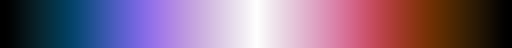

In [129]:
cm = Colormap('cmasher:emergency') 
cm

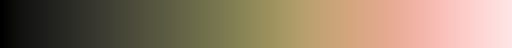

In [130]:
cm1 = Colormap('crameri:turku') 
cm1

In [131]:

bricks = []

for name, df in dfs.items():
    print(name)
    print(df.head())
    print(df.describe())
    if "value" in df.keys():

        for k in list(set(df["scheme"])):
            _df = df[df["scheme"] == k]
            for level in  ["hf", "mp2"]:
                l_df = _df[_df["level"]== "mp2"]
                for i in [1,0,2]:

                    f_df = l_df[_df["atom_index"]== i]
                    for j in range(2):
                        
                        maxx=f_df["value"].max()
                        minn=f_df["value"].min()
                        if j == 1:
                            maxx=max(df["value"].max(), abs(df["value"].min()))
                            minn=-max(df["value"].max(), abs(df["value"].min()))

                        ax = Brick()
                        CM = cm1.to_matplotlib() if j == 0 else cm.to_matplotlib()
                        ax.scatter(f_df["r1"] + f_df["r2"] + (f_df["r1"]*f_df["r2"]), f_df["ang"], c=f_df["value"], cmap=CM, 
                                        vmin=minn, vmax=maxx, s=15, alpha=1.0)
                        ax.set_xlim(3, 3.68)
                        ax.set_ylim(120,180)
                        label = "C" if i == 0 else "O"
                        ax.set_title(f"{k} {label} {level.upper()}")
                        
                        ax = ax.add_colorbar(cmap=CM, vmin=minn, vmax=maxx, hratio=1)
                        bricks.append(ax)


df_charges_long
    r1   r2    ang level  atom_index atom     scheme     value
0  1.0  1.0  120.0    hf           0    C  Hirshfeld  0.424593
1  1.0  1.0  120.0    hf           1    O  Hirshfeld -0.212303
2  1.0  1.0  120.0    hf           2    O  Hirshfeld -0.212289
3  1.0  1.0  120.0    hf           0    C        VDD  0.430338
4  1.0  1.0  120.0    hf           1    O        VDD -0.217065
                 r1            r2           ang    atom_index         value
count  27540.000000  27540.000000  27540.000000  27540.000000  2.754000e+04
mean       1.004999      1.209341    149.721362      1.000000  4.990231e-07
std        0.017743      0.156952     18.231613      0.816511  5.824804e-01
min        1.000000      1.000000    120.000000      0.000000 -7.344776e-01
25%        1.000000      1.079000    132.632000      0.000000 -4.460528e-01
50%        1.000000      1.184000    148.421000      1.000000 -2.338960e-01
75%        1.000000      1.342000    164.211000      2.000000  4.961587e-0

In [132]:
dfs["df_charges_long"].groupby(["atom","scheme", "level",])[["value"]].mean() 
# dfs["df_charges_long"].groupby(["atom","scheme", "level",])[["value"]].std()

value
atom scheme    level          
C    ADCH      hf     0.682427
               mp2    0.681929
     Becke     hf     0.701352
               mp2    0.701260
     CHELPG    hf     0.875403
               mp2    0.874932
     CM5       hf     0.513416
               mp2    0.513450
     Hirshfeld hf     0.410867
               mp2    0.411036
     MBIS      hf     1.195418
               mp2    1.194823
     MBIS_raw  hf     1.195421
               mp2    1.194826
     MK        hf     0.825417
               mp2    0.824927
     VDD       hf     0.449425
               mp2    0.449638
O    ADCH      hf    -0.341214
               mp2   -0.340964
     Becke     hf    -0.350676
               mp2   -0.350630
     CHELPG    hf    -0.437702
               mp2   -0.437466
     CM5       hf    -0.256708
               mp2   -0.256725
     Hirshfeld hf    -0.205433
               mp2   -0.205518
     MBIS      hf    -0.597709
               mp2   -0.597411
     MBIS_raw  hf    -0.597704
               mp2   -0.597406
     MK        hf    -0.412709
               mp2   -0.412463
     VDD       hf    -0.224713
               mp2   -0.224819

In [133]:
dfs["df_charges_long"]

,r1,r2,ang,level,atom_index,atom,scheme,value
0,1.0,1.0,120.0,hf,0,C,Hirshfeld,0.424593
1,1.0,1.0,120.0,hf,1,O,Hirshfeld,-0.212303
2,1.0,1.0,120.0,hf,2,O,Hirshfeld,-0.212289
3,1.0,1.0,120.0,hf,0,C,VDD,0.430338
4,1.0,1.0,120.0,hf,1,O,VDD,-0.217065
...,...,...,...,...,...,...,...,...
27535,1.5,1.5,180.0,mp2,1,O,MBIS,-0.478540
27536,1.5,1.5,180.0,mp2,2,O,MBIS,-0.478540
27537,1.5,1.5,180.0,mp2,0,C,MBIS_raw,0.957075
27538,1.5,1.5,180.0,mp2,1,O,MBIS_raw,-0.478549


In [134]:
dfs["df_charges_long"]

,r1,r2,ang,level,atom_index,atom,scheme,value
0,1.0,1.0,120.0,hf,0,C,Hirshfeld,0.424593
1,1.0,1.0,120.0,hf,1,O,Hirshfeld,-0.212303
2,1.0,1.0,120.0,hf,2,O,Hirshfeld,-0.212289
3,1.0,1.0,120.0,hf,0,C,VDD,0.430338
4,1.0,1.0,120.0,hf,1,O,VDD,-0.217065
...,...,...,...,...,...,...,...,...
27535,1.5,1.5,180.0,mp2,1,O,MBIS,-0.478540
27536,1.5,1.5,180.0,mp2,2,O,MBIS,-0.478540
27537,1.5,1.5,180.0,mp2,0,C,MBIS_raw,0.957075
27538,1.5,1.5,180.0,mp2,1,O,MBIS_raw,-0.478549


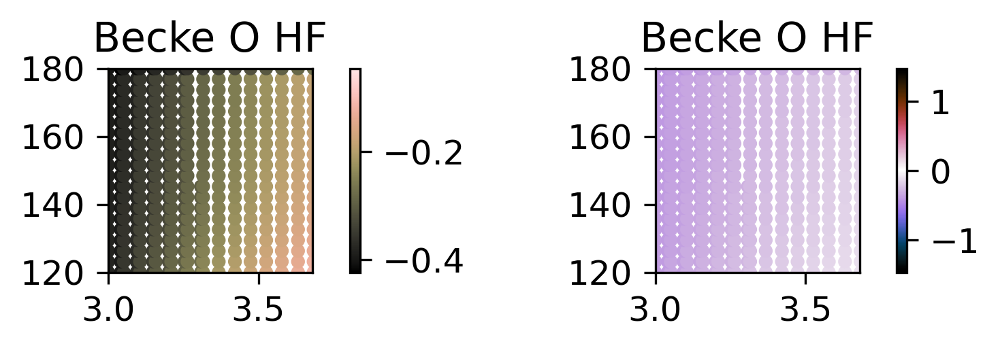

In [135]:
bricks[0] | bricks[1]

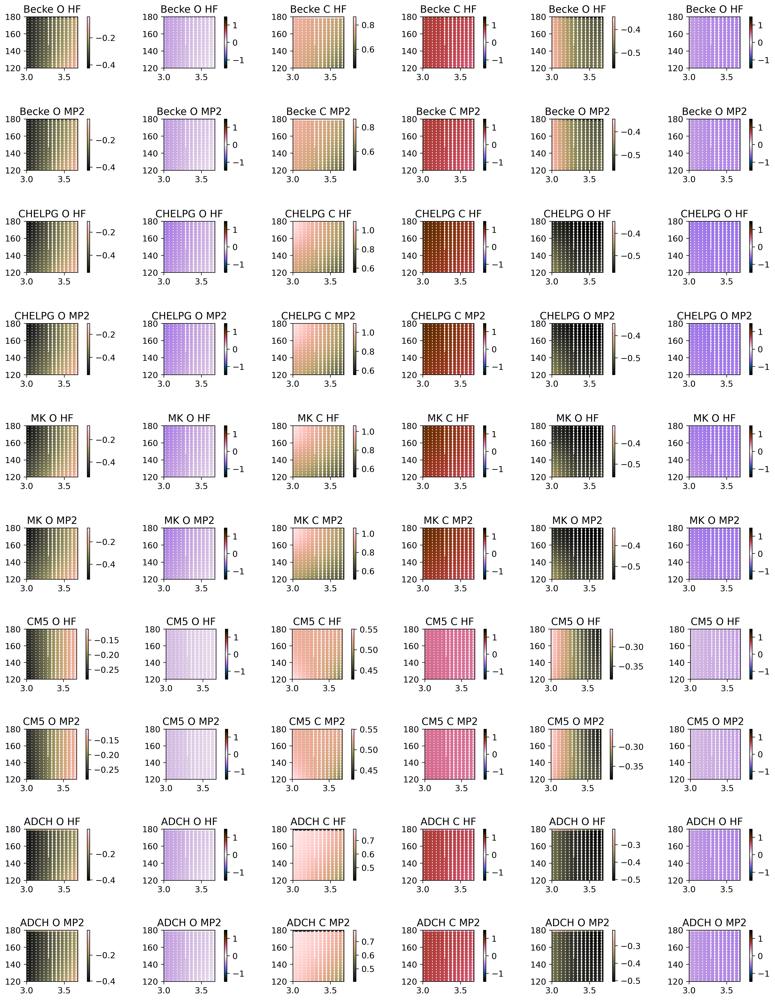

In [136]:
N = 0
pw.stack([pw.stack(bricks[N*6:6*N+6]) for N in range(10)], operator="/")

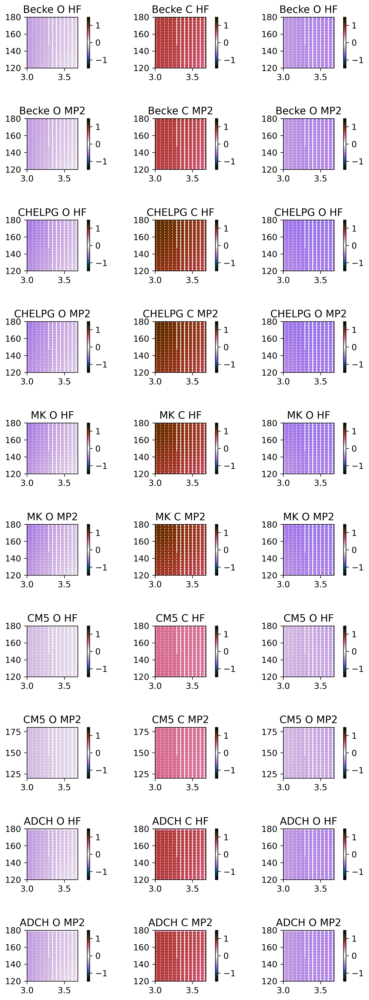

In [137]:
N = 0
pw.stack([pw.stack(bricks[1+N*6:6*N+6:2]) for N in range(10)], operator="/")

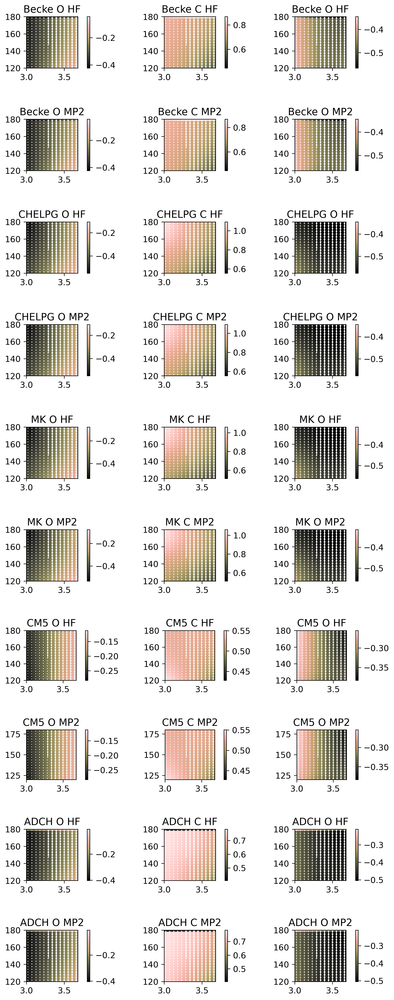

In [138]:
N = 0
pw.stack([pw.stack(bricks[N*6:6*N+6:2]) for N in range(10)], operator="/")

In [139]:
list(set(dfs["df_charges_long"]["scheme"]))

['Becke',
 'CHELPG',
 'MK',
 'CM5',
 'ADCH',
 'VDD',
 'MBIS',
 'MBIS_raw',
 'Hirshfeld']

In [140]:
import numpy as np
from scipy.interpolate import griddata

# --- switches ---
plot_kind = "contour"  # "contour" for colored contours, "colormap" for a continuous image
grid_nx, grid_ny = 180, 180  # grid resolution
contour_levels = 18          # only used when plot_kind == "contour"

bricks = []

for name, df in dfs.items():
    print(name)
    print(df.head())
    print(df.describe())
    if "value" in df.keys():

        for k in list(set(df["scheme"])):
            _df = df[df["scheme"] == k]

            for level in ["hf", "mp2"]:
                # fix: respect the selected level
                l_df = _df[_df["level"] == level]

                for i in [1, 0, 2]:
                    # fix: filter from l_df (not _df)
                    f_df = l_df[l_df["atom_index"] == i].copy()
                    if f_df.empty:
                        continue

                    # x/y from your original scatter definition
                    x = f_df["r1"] + f_df["r2"] + (f_df["r1"] * f_df["r2"])
                    y = f_df["ang"]
                    z = f_df["value"]

                    # plotting window from your limits
                    xmin, xmax = 3.0, 3.68
                    ymin, ymax = 120.0, 180.0

                    # build grid
                    xi = np.linspace(xmin, xmax, grid_nx)
                    yi = np.linspace(ymin, ymax, grid_ny)
                    XI, YI = np.meshgrid(xi, yi)

                    # interpolate scattered data to grid
                    # (linear is usually good; fallback to nearest where needed)
                    ZI = griddata(
                        points=np.column_stack((x.values, y.values)),
                        values=z.values,
                        xi=(XI, YI),
                        method="linear"
                    )
                    # Fill any remaining NaNs (outside convex hull) with nearest
                    mask = np.isnan(ZI)
                    if np.any(mask):
                        ZI_nearest = griddata(
                            points=np.column_stack((x.values, y.values)),
                            values=z.values,
                            xi=(XI, YI),
                            method="nearest"
                        )
                        ZI[mask] = ZI_nearest[mask]

                    for j in (0, 1):
                        # color scale options: original vs symmetric
                        if j == 0:
                            vmin, vmax = z.min(), z.max()
                        else:
                            vmax = max(z.max(), abs(z.min()), df["value"].abs().max())
                            vmin = -vmax

                        ax = Brick()
                        CM = (cm1.to_matplotlib() if j == 0 else cm.to_matplotlib())

                        if plot_kind == "contour":
                            # colored contour plot
                            ax.contourf(
                                XI, YI, ZI,
                                levels=contour_levels,
                                cmap=CM, vmin=vmin, vmax=vmax
                            )
                        else:
                            # continuous colormap (image)
                            # note: origin='lower' so y increases upward
                            ax.imshow(
                                ZI,
                                extent=(xmin, xmax, ymin, ymax),
                                origin="lower",
                                aspect="auto",
                                cmap=CM, vmin=vmin, vmax=vmax
                            )

                        ax.set_xlim(xmin, xmax)
                        ax.set_ylim(ymin, ymax)

                        label = "C" if i == 0 else "O"
                        ax.set_title(f"{k} {label} {level.upper()}")

                        ax = ax.add_colorbar(cmap=CM, vmin=vmin, vmax=vmax, hratio=1)
                        bricks.append(ax)


df_charges_long
    r1   r2    ang level  atom_index atom     scheme     value
0  1.0  1.0  120.0    hf           0    C  Hirshfeld  0.424593
1  1.0  1.0  120.0    hf           1    O  Hirshfeld -0.212303
2  1.0  1.0  120.0    hf           2    O  Hirshfeld -0.212289
3  1.0  1.0  120.0    hf           0    C        VDD  0.430338
4  1.0  1.0  120.0    hf           1    O        VDD -0.217065
                 r1            r2           ang    atom_index         value
count  27540.000000  27540.000000  27540.000000  27540.000000  2.754000e+04
mean       1.004999      1.209341    149.721362      1.000000  4.990231e-07
std        0.017743      0.156952     18.231613      0.816511  5.824804e-01
min        1.000000      1.000000    120.000000      0.000000 -7.344776e-01
25%        1.000000      1.079000    132.632000      0.000000 -4.460528e-01
50%        1.000000      1.184000    148.421000      1.000000 -2.338960e-01
75%        1.000000      1.342000    164.211000      2.000000  4.961587e-0

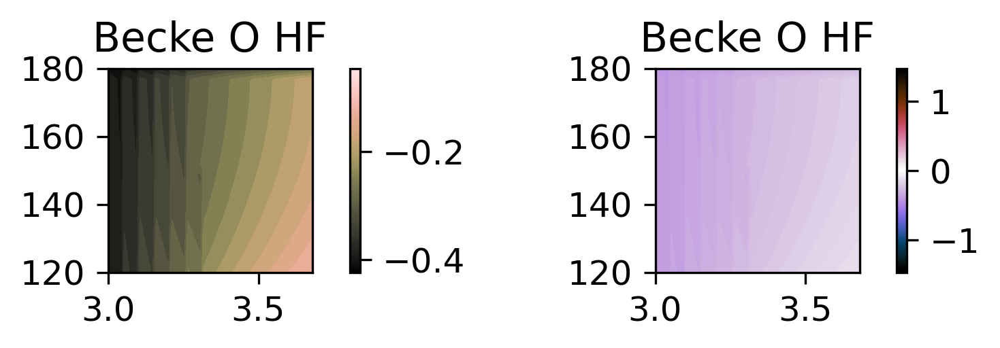

In [141]:
bricks[0] | bricks[1]

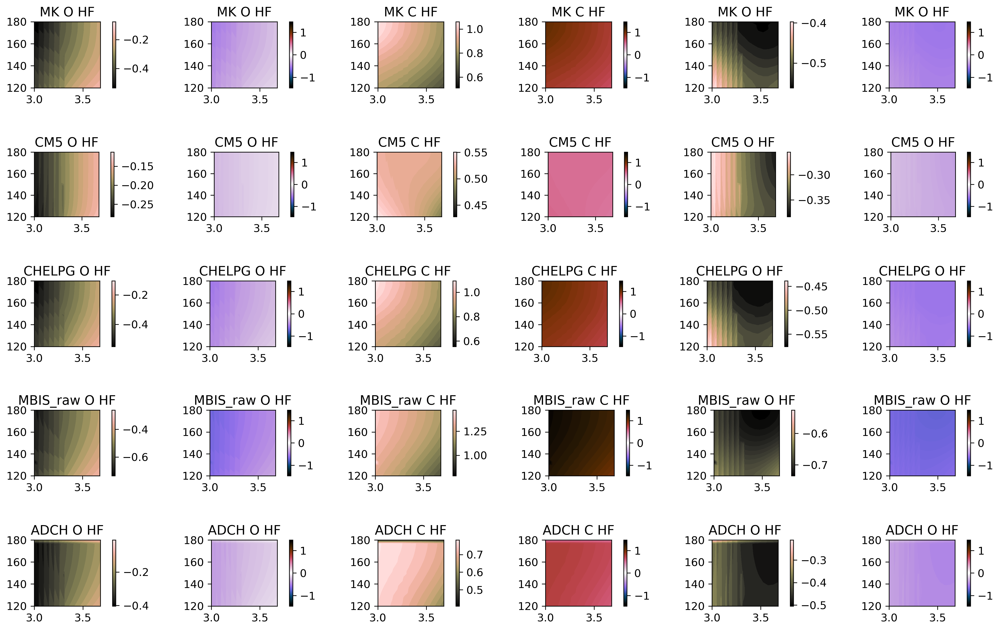

In [300]:
N = 0
pw.stack([pw.stack(bricks[N*6:6*N+6]) for N in range(0,10,2)], operator="/")

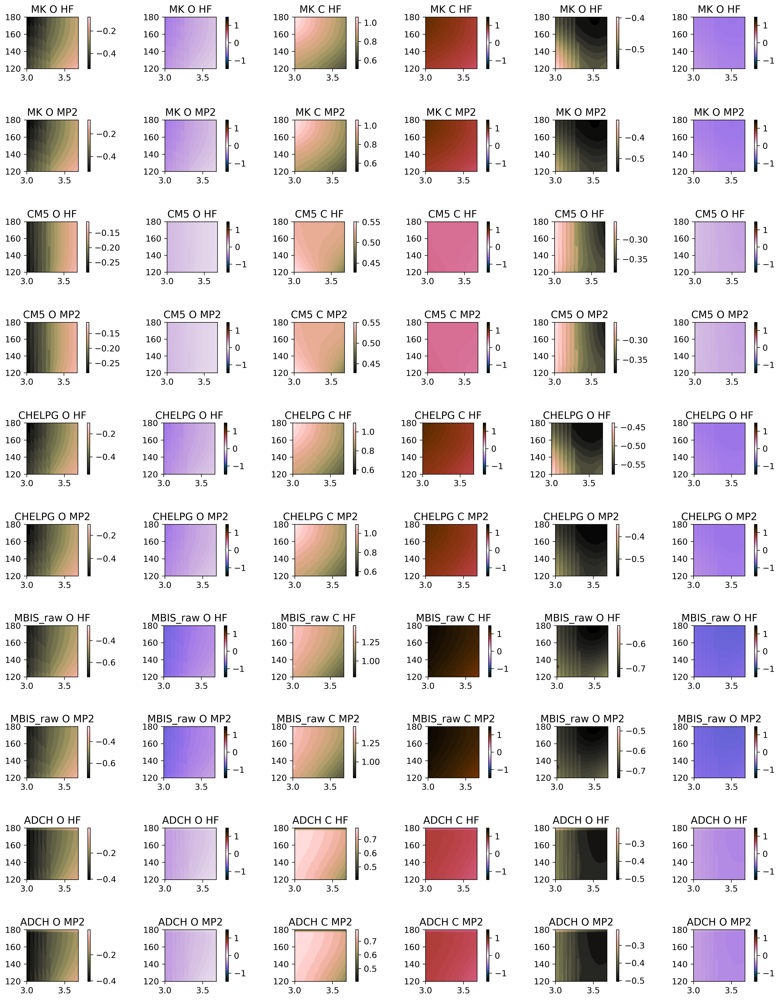

In [297]:
N = 0
pw.stack([pw.stack(bricks[N*6:6*N+6]) for N in range(10)], operator="/")

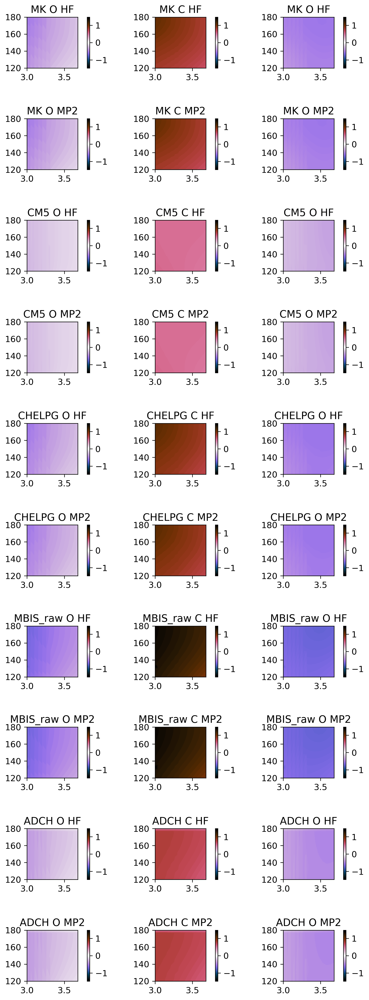

In [298]:
N = 0
pw.stack([pw.stack(bricks[1+N*6:6*N+6:2]) for N in range(10)], operator="/")

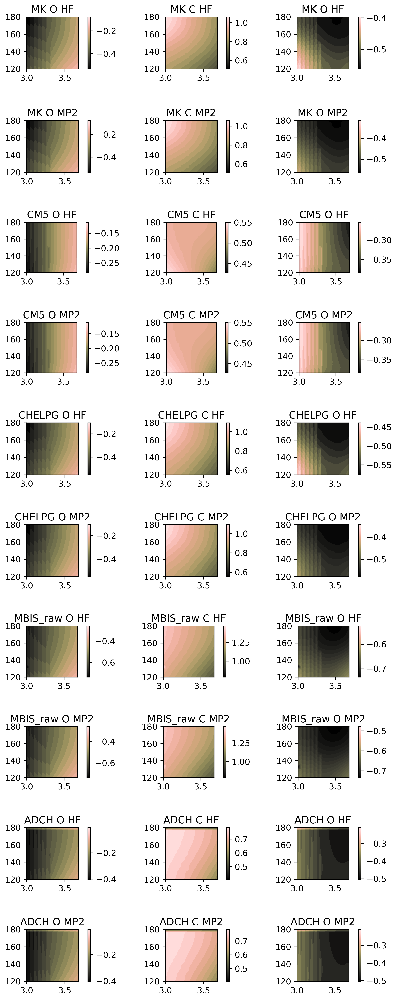

In [299]:
N = 0
pw.stack([pw.stack(bricks[N*6:6*N+6:2]) for N in range(10)], operator="/")